# Import libraries 

In [1]:
# import libraries

# 1. to handle the data
import pandas as pd
import numpy as np

# to visualize the dataset
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# this is for jupyter notebook to show the plot in the notebook itself instead of opening a new window
%matplotlib inline

# To preprocess the data
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler , QuantileTransformer

# machine learning
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold, KFold
from sklearn.multioutput import MultiOutputClassifier
#Model
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier, Pool
from catboost.utils import eval_metric

#Evaluation
from sklearn.metrics import roc_auc_score

# ignore warnings   
import warnings
warnings.filterwarnings('ignore')

# Set display options for maximum columns and rows
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [2]:
palette = [ '#0077b6' , '#00b4d8' , '#90e0ef' , '#caf0f8']
color_palette = sns.color_palette(palette)

# Loading data

In [4]:
# Load Submission Data 
df_submission = pd.read_csv('sample_submission.csv')
# Load test Data 
df_test = pd.read_csv('test.csv')
# Load Train Dataset and show head of Data 
#Train Data 
df_train = pd.read_csv('train.csv')

In [5]:
test_id = df_test["id"]

In [6]:
# Dropping id from train and test 
df_train.drop('id',axis=1,inplace=True)
df_test.drop('id',axis=1,inplace=True)

In [8]:
# Orginal
df_org = pd.read_csv('SteelPlatesFaults.csv')

In [9]:
# Concating df_org and df_train DataFrames
df_train = pd.concat([df_org, df_train], ignore_index=True)
df_train.reset_index(inplace=True,drop=True)

# Target

In [11]:
#Let's Create a single target variable
# Target Columns
target_col = ['Pastry', 'Z_Scratch', 'K_Scatch', 'Stains', 'Dirtiness', 'Bumps', 'Other_Faults']
# Function
def combine_target_variables(row):
    defect = None
    for col in target_col:
        if row[col] == 1:
            defect = col
            break
    if defect:
        return defect
    else:
        return 'No Defect'
    
df_train['Target'] = df_train.apply(combine_target_variables, axis=1)

In [14]:
# # making a Copy of the Test Data for Future Use 
df_test = pd.read_csv('test.csv')
df_test_ov = df_test.copy()
df_test.head()

,id,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,Length_of_Conveyer,TypeOfSteel_A300,TypeOfSteel_A400,Steel_Plate_Thickness,Edges_Index,Empty_Index,Square_Index,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas
0,19219,1015,1033,3826564,3826588,659,23,46,62357,67,127,1656,0,1,150,0.3877,0.4896,0.3273,0.0095,0.5652,1.0000,1.0,2.8410,1.1139,1.6628,0.6727,-0.2261,0.9172
1,19220,1257,1271,419960,419973,370,26,28,39293,92,132,1354,0,1,40,0.1629,0.4136,0.0938,0.0047,0.2414,1.0000,1.0,2.5682,0.9031,1.4472,0.9063,-0.1453,0.9104
2,19221,1358,1372,117715,117724,289,36,32,29386,101,134,1360,0,1,40,0.0609,0.6234,0.4762,0.0155,0.6000,0.7500,0.0,2.4609,1.3222,1.3222,-0.5238,-0.0435,0.6514
3,19222,158,168,232415,232440,80,10,11,8586,107,140,1690,1,0,100,0.4439,0.3333,0.8182,0.0037,0.8000,1.0000,1.0,1.9031,0.6990,1.0414,0.1818,-0.0738,0.2051
4,19223,559,592,544375,544389,140,19,15,15524,103,134,1688,1,0,60,0.8191,0.2619,0.4286,0.0158,0.8421,0.5333,0.0,2.1461,1.3222,1.1461,-0.5714,-0.0894,0.4170


# sample preview 

In [15]:
df_train.head()

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,Length_of_Conveyer,TypeOfSteel_A300,TypeOfSteel_A400,Steel_Plate_Thickness,Edges_Index,Empty_Index,Square_Index,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas,Pastry,Z_Scratch,K_Scatch,Stains,Dirtiness,Bumps,Other_Faults,Target
0,42,50,270900,270944,267,17,44,24220,76,108,1687,1,0,80,0.0498,0.2415,0.1818,0.0047,0.4706,1.0000,1.0,2.4265,0.9031,1.6435,0.8182,-0.2913,0.5822,1,0,0,0,0,0,0,Pastry
1,645,651,2538079,2538108,108,10,30,11397,84,123,1687,1,0,80,0.7647,0.3793,0.2069,0.0036,0.6000,0.9667,1.0,2.0334,0.7782,1.4624,0.7931,-0.1756,0.2984,1,0,0,0,0,0,0,Pastry
2,829,835,1553913,1553931,71,8,19,7972,99,125,1623,1,0,100,0.9710,0.3426,0.3333,0.0037,0.7500,0.9474,1.0,1.8513,0.7782,1.2553,0.6667,-0.1228,0.2150,1,0,0,0,0,0,0,Pastry
3,853,860,369370,369415,176,13,45,18996,99,126,1353,0,1,290,0.7287,0.4413,0.1556,0.0052,0.5385,1.0000,1.0,2.2455,0.8451,1.6532,0.8444,-0.1568,0.5212,1,0,0,0,0,0,0,Pastry
4,1289,1306,498078,498335,2409,60,260,246930,37,126,1353,0,1,185,0.0695,0.4486,0.0662,0.0126,0.2833,0.9885,1.0,3.3818,1.2305,2.4099,0.9338,-0.1992,1.0000,1,0,0,0,0,0,0,Pastry


In [16]:
df_test.head()

,id,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,Length_of_Conveyer,TypeOfSteel_A300,TypeOfSteel_A400,Steel_Plate_Thickness,Edges_Index,Empty_Index,Square_Index,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas
0,19219,1015,1033,3826564,3826588,659,23,46,62357,67,127,1656,0,1,150,0.3877,0.4896,0.3273,0.0095,0.5652,1.0000,1.0,2.8410,1.1139,1.6628,0.6727,-0.2261,0.9172
1,19220,1257,1271,419960,419973,370,26,28,39293,92,132,1354,0,1,40,0.1629,0.4136,0.0938,0.0047,0.2414,1.0000,1.0,2.5682,0.9031,1.4472,0.9063,-0.1453,0.9104
2,19221,1358,1372,117715,117724,289,36,32,29386,101,134,1360,0,1,40,0.0609,0.6234,0.4762,0.0155,0.6000,0.7500,0.0,2.4609,1.3222,1.3222,-0.5238,-0.0435,0.6514
3,19222,158,168,232415,232440,80,10,11,8586,107,140,1690,1,0,100,0.4439,0.3333,0.8182,0.0037,0.8000,1.0000,1.0,1.9031,0.6990,1.0414,0.1818,-0.0738,0.2051
4,19223,559,592,544375,544389,140,19,15,15524,103,134,1688,1,0,60,0.8191,0.2619,0.4286,0.0158,0.8421,0.5333,0.0,2.1461,1.3222,1.1461,-0.5714,-0.0894,0.4170


In [17]:
df_submission.head()

,id,Pastry,Z_Scratch,K_Scatch,Stains,Dirtiness,Bumps,Other_Faults
0,19219,0.5,0.5,0.5,0.5,0.5,0.5,0.5
1,19220,0.5,0.5,0.5,0.5,0.5,0.5,0.5
2,19221,0.5,0.5,0.5,0.5,0.5,0.5,0.5
3,19222,0.5,0.5,0.5,0.5,0.5,0.5,0.5
4,19223,0.5,0.5,0.5,0.5,0.5,0.5,0.5


#  Datasets information 

In [18]:
# Checking the number of rows and columns

num_train_rows, num_train_columns = df_train.shape

num_test_rows, num_test_columns = df_test.shape

num_submission_rows, num_submission_columns = df_submission.shape

print("Training Data:")
print(f"Number of Rows: {num_train_rows}")
print(f"Number of Columns: {num_train_columns}\n")

print("Test Data:")
print(f"Number of Rows: {num_test_rows}")
print(f"Number of Columns: {num_test_columns}\n")

print("Submission Data:")
print(f"Number of Rows: {num_submission_rows}")
print(f"Number of Columns: {num_submission_columns}")

Training Data:
Number of Rows: 21160
Number of Columns: 35

Test Data:
Number of Rows: 12814
Number of Columns: 28

Submission Data:
Number of Rows: 12814
Number of Columns: 8


In [19]:
# Null Values in Train 
train_null = df_train.isnull().sum().sum()

#Null Count in Test 
test_null = df_test.isnull().sum().sum()

#null Count in Submission
submission_null = df_submission.isnull().sum().sum()

print(f'Null Count in Train: {train_null}')
print(f'Null Count in Test: {test_null}')
print(f'Null Count in Submission: {submission_null}')

Null Count in Train: 0
Null Count in Test: 0
Null Count in Submission: 0


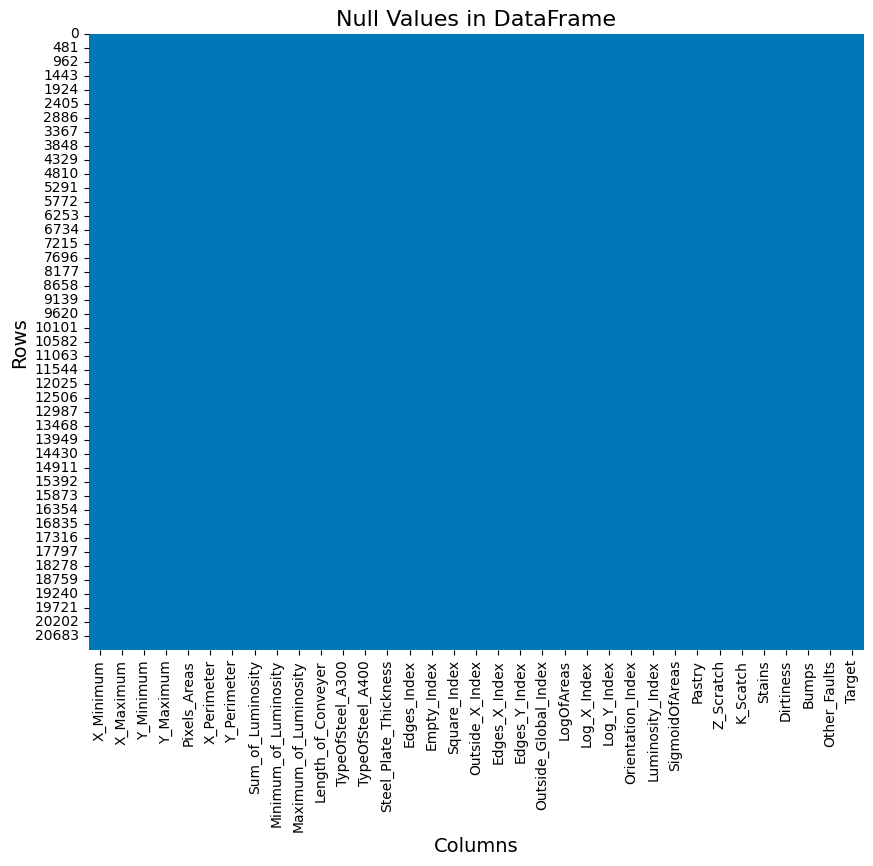

In [21]:
# Heatmap to visualize null values
plt.figure(figsize=(10, 8))
sns.heatmap(df_train.isnull(), cmap=palette[0:1], cbar=False)
plt.title('Null Values in DataFrame', fontsize=16)
plt.xlabel('Columns', fontsize=14)
plt.ylabel('Rows', fontsize=14)
plt.show()

# duplicates

In [22]:
# Count duplicate rows in train_data
train_duplicates = df_train.duplicated().sum()

# Count duplicate rows in test_data
test_duplicates = df_test.duplicated().sum()

# Count duplicate rows in original_data
submission_duplicates = df_submission.duplicated().sum()

# Print the results
print(f"Number of duplicate rows in train_data: {train_duplicates}")
print(f"Number of duplicate rows in test_data: {test_duplicates}")
print(f"Number of duplicate rows in test_data: {submission_duplicates}")

Number of duplicate rows in train_data: 0
Number of duplicate rows in test_data: 0
Number of duplicate rows in test_data: 0


# Info

In [23]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21160 entries, 0 to 21159
Data columns (total 35 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   X_Minimum              21160 non-null  int64  
 1   X_Maximum              21160 non-null  int64  
 2   Y_Minimum              21160 non-null  int64  
 3   Y_Maximum              21160 non-null  int64  
 4   Pixels_Areas           21160 non-null  int64  
 5   X_Perimeter            21160 non-null  int64  
 6   Y_Perimeter            21160 non-null  int64  
 7   Sum_of_Luminosity      21160 non-null  int64  
 8   Minimum_of_Luminosity  21160 non-null  int64  
 9   Maximum_of_Luminosity  21160 non-null  int64  
 10  Length_of_Conveyer     21160 non-null  int64  
 11  TypeOfSteel_A300       21160 non-null  int64  
 12  TypeOfSteel_A400       21160 non-null  int64  
 13  Steel_Plate_Thickness  21160 non-null  int64  
 14  Edges_Index            21160 non-null  float64
 15  Em

# Describe

In [24]:
df_train.describe()

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,Length_of_Conveyer,TypeOfSteel_A300,TypeOfSteel_A400,Steel_Plate_Thickness,Edges_Index,Empty_Index,Square_Index,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas,Pastry,Z_Scratch,K_Scatch,Stains,Dirtiness,Bumps,Other_Faults
count,21160.000000,21160.000000,2.116000e+04,2.116000e+04,21160.000000,21160.000000,21160.000000,2.116000e+04,21160.000000,21160.000000,21160.000000,21160.000000,21160.000000,21160.000000,21160.000000,21160.000000,21160.000000,21160.000000,21160.000000,21160.000000,21160.000000,21160.00000,21160.000000,21160.000000,21160.000000,21160.000000,21160.000000,21160.000000,21160.000000,21160.000000,21160.000000,21160.000000,21160.000000,21160.000000
mean,697.130057,741.392202,1.831495e+06,1.828639e+06,1703.240832,97.140737,65.852457,1.931736e+05,84.784594,128.789225,1459.333270,0.402457,0.596645,76.444707,0.350992,0.409758,0.574176,0.030862,0.614362,0.829984,0.590416,2.47521,1.314778,1.390978,0.100958,-0.137733,0.573142,0.076749,0.063327,0.180671,0.030246,0.025520,0.244093,0.341730
std,532.054574,501.160090,1.892922e+06,1.886266e+06,3884.800851,192.510008,161.187566,4.489348e+05,29.121342,14.672936,145.474688,0.490405,0.490583,54.042441,0.317310,0.125408,0.260519,0.048493,0.224385,0.222276,0.482089,0.76322,0.469162,0.410274,0.488925,0.123237,0.332903,0.266198,0.243556,0.384755,0.171267,0.157701,0.429558,0.474301
min,0.000000,4.000000,6.712000e+03,6.724000e+03,2.000000,2.000000,1.000000,2.500000e+02,0.000000,37.000000,1227.000000,0.000000,0.000000,40.000000,0.000000,0.000000,0.008300,0.001500,0.014400,0.048400,0.000000,0.30100,0.301000,0.000000,-0.991000,-0.998900,0.119000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,50.000000,214.000000,6.394900e+05,6.395070e+05,88.000000,15.000000,14.000000,9.778000e+03,68.000000,124.000000,1358.000000,0.000000,0.000000,40.000000,0.059100,0.317500,0.375000,0.006600,0.450000,0.650000,0.000000,1.94450,1.000000,1.079200,-0.272700,-0.192600,0.253200,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,754.000000,772.000000,1.378585e+06,1.378261e+06,169.000000,25.000000,24.000000,1.840200e+04,90.000000,127.000000,1364.000000,0.000000,1.000000,69.000000,0.237100,0.413300,0.545400,0.009500,0.636400,0.961500,1.000000,2.22790,1.146100,1.322200,0.111100,-0.142600,0.472900,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1145.000000,1161.000000,2.339627e+06,2.336466e+06,659.000000,67.000000,62.000000,6.841600e+04,105.000000,135.000000,1652.000000,1.000000,1.000000,80.000000,0.648650,0.495200,0.818200,0.019200,0.785700,1.000000,1.000000,2.81890,1.431400,1.716000,0.526300,-0.082800,0.999400,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,1705.000000,1713.000000,1.298766e+07,1.298769e+07,152655.000000,10449.000000,18152.000000,1.159141e+07,203.000000,253.000000,1794.000000,1.000000,1.000000,300.000000,0.995200,0.943900,1.000000,0.875900,1.000000,1.000000,1.000000,5.18370,3.074100,4.258700,0.991700,0.642100,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# EDA (Explorartary Data Analysis)

In [25]:
# Function to Plot Single Pie and Bar Plot
def single_plot_distribution(column_name, dataframe):
    # Get the value counts of the specified column
    value_counts = dataframe[column_name].value_counts()

    # Set up the figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5), gridspec_kw={'width_ratios': [1, 1]}) 

    # Donut pie chart
    pie_colors = palette[0:3]
    ax1.pie(value_counts, autopct='%0.001f%%', startangle=90, pctdistance=0.85, colors=pie_colors, labels=None)
    centre_circle = plt.Circle((0,0),0.70,fc='white')
    ax1.add_artist(centre_circle)
    ax1.set_title(f'Distribution of {column_name}', fontsize=16)

    # Bar chart
    bar_colors = palette[0:3]
    sns.barplot(x=value_counts.index, y=value_counts.values, ax=ax2, palette=bar_colors,) 
    ax2.set_title(f'Count of {column_name}', fontsize=16)
    ax2.set_xlabel(column_name, fontsize=14)
    ax2.set_ylabel('Count', fontsize=14)

    # Rotate x-axis labels for better readability
    ax2.tick_params(axis='x', rotation=45)

    # Show the plots
    plt.tight_layout()
    plt.show()

In [26]:
# Function to Plot Multiple Pie and Bar Plot
def plot_distribution(columns, dataframe):
    # Set up the figure with subplots based on the number of columns
    num_cols = len(columns)
    fig, axes = plt.subplots(2, num_cols, figsize=(num_cols * 6, 6))

    # Iterate over each column name
    for i, column_name in enumerate(columns):
        # Get the value counts of the specified column
        value_counts = dataframe[column_name].value_counts()

        # Donut pie chart
        pie_colors = palette[0:3]
        axes[0, i].pie(value_counts, labels=None, autopct='%1.1f%%', startangle=90, pctdistance=0.85, colors=pie_colors)
        centre_circle = plt.Circle((0,0),0.70,fc='white')
        axes[0, i].add_artist(centre_circle)
        axes[0, i].set_title(f'Distribution of {column_name}', fontsize=16)

        # Rotate x-axis labels for better readability
        axes[0, i].tick_params(axis='x', rotation=45)

        # Bar plot
        bar_colors = palette[0:3]
        sns.barplot(x=value_counts.index, y=value_counts.values, ax=axes[1, i], palette=bar_colors)
        axes[1, i].set_title(f'Count of {column_name}', fontsize=16)
        axes[1, i].set_xlabel(column_name, fontsize=14)
        axes[1, i].set_ylabel('Count', fontsize=14)

        # Rotate x-axis labels for better readability
        axes[1, i].tick_params(axis='x', rotation=45)

    # Adjust layout and show the plots
    plt.tight_layout()
    plt.show()

## Target Count

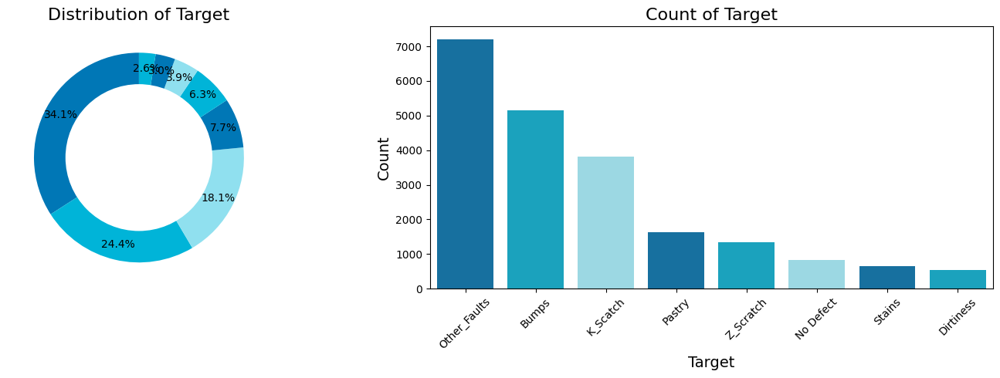

In [27]:
# Calling the function with column name and dataframe
single_plot_distribution('Target', df_train)

## Each target Variable Count

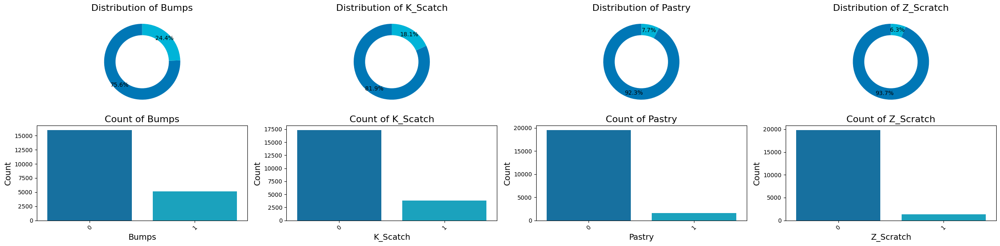

In [28]:
# Call the function with the specified columns and the dataframe
plot_distribution(['Bumps','K_Scatch','Pastry','Z_Scratch'], df_train)

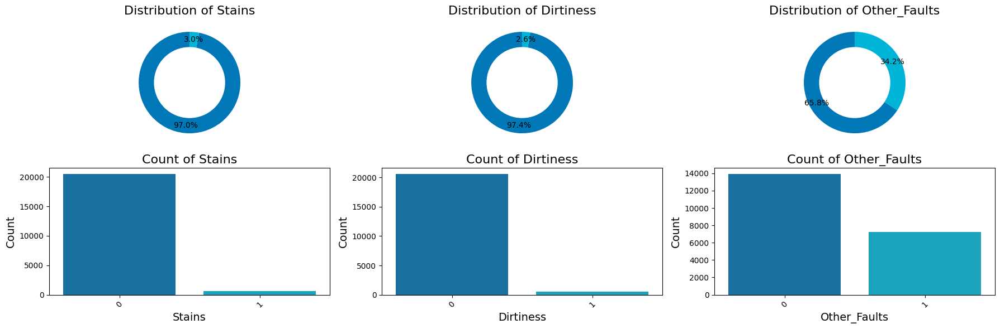

In [29]:
# Call the function with the specified columns and the dataframe
plot_distribution(['Stains', 'Dirtiness', 'Other_Faults'], df_train)

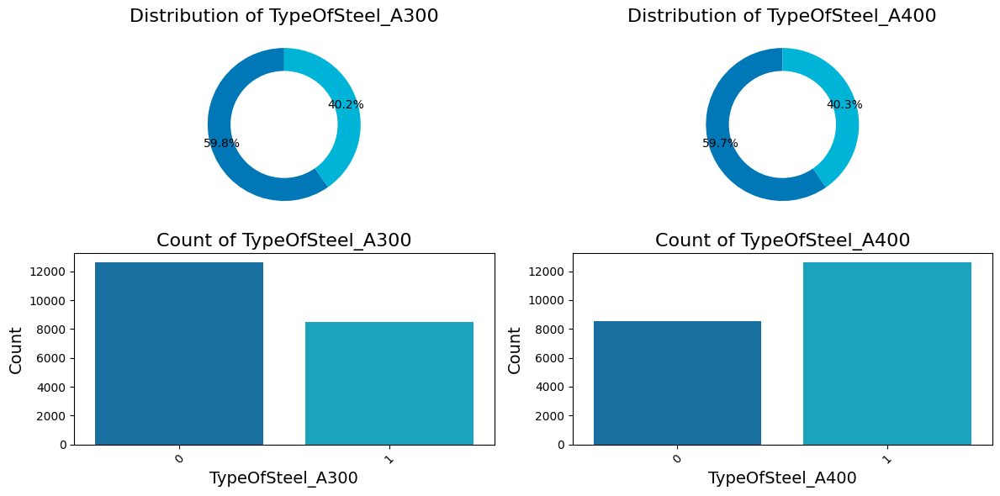

In [30]:
# Call the function with the specified columns and the dataframe
plot_distribution(['TypeOfSteel_A300','TypeOfSteel_A400'], df_train)

In [32]:
 #List of numerical columns
num_cols = ['X_Minimum', 'X_Maximum', 'Y_Minimum', 'Y_Maximum',
            'Pixels_Areas', 'X_Perimeter', 'Y_Perimeter', 'Sum_of_Luminosity',
            'Minimum_of_Luminosity', 'Maximum_of_Luminosity', 'Length_of_Conveyer', 'Steel_Plate_Thickness',
            'Edges_Index', 'Empty_Index', 'Square_Index', 'Outside_X_Index',
            'Edges_X_Index', 'Edges_Y_Index', 'LogOfAreas',
            'Log_X_Index', 'Log_Y_Index', 'Orientation_Index', 'Luminosity_Index',
            'SigmoidOfAreas']

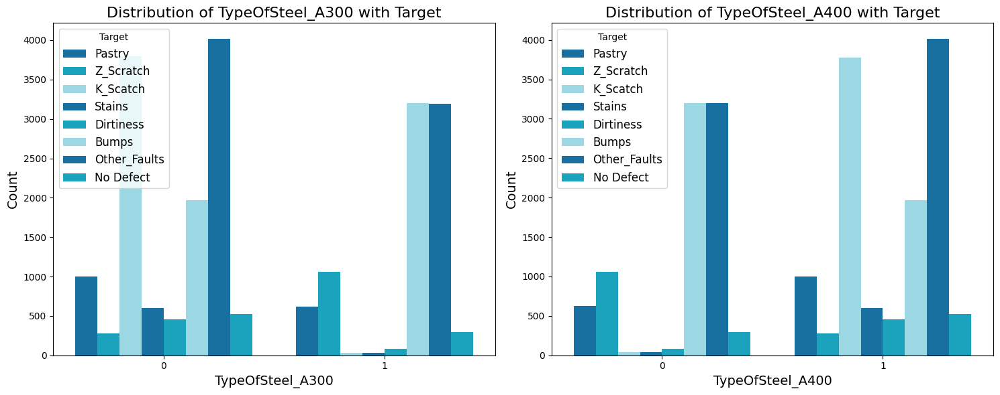

In [33]:
# Create the plot
plt.figure(figsize=(15, 6))

# Plot the first subplot
plt.subplot(1, 2, 1)
sns.countplot(data=df_train, x='TypeOfSteel_A300', hue='Target', palette=palette[0:3])

# Add labels and title for the first subplot
plt.title('Distribution of TypeOfSteel_A300 with Target', fontsize=16)
plt.xlabel('TypeOfSteel_A300', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.legend(title='Target', fontsize=12)

# Plot the second subplot
plt.subplot(1, 2, 2)
sns.countplot(data=df_train, x='TypeOfSteel_A400', hue='Target', palette=palette[0:3])

# Add labels and title for the second subplot
plt.title('Distribution of TypeOfSteel_A400 with Target', fontsize=16)
plt.xlabel('TypeOfSteel_A400', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.legend(title='Target', fontsize=12)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [34]:
df_train.columns

Index(['X_Minimum', 'X_Maximum', 'Y_Minimum', 'Y_Maximum', 'Pixels_Areas',
       'X_Perimeter', 'Y_Perimeter', 'Sum_of_Luminosity',
       'Minimum_of_Luminosity', 'Maximum_of_Luminosity', 'Length_of_Conveyer',
       'TypeOfSteel_A300', 'TypeOfSteel_A400', 'Steel_Plate_Thickness',
       'Edges_Index', 'Empty_Index', 'Square_Index', 'Outside_X_Index',
       'Edges_X_Index', 'Edges_Y_Index', 'Outside_Global_Index', 'LogOfAreas',
       'Log_X_Index', 'Log_Y_Index', 'Orientation_Index', 'Luminosity_Index',
       'SigmoidOfAreas', 'Pastry', 'Z_Scratch', 'K_Scatch', 'Stains',
       'Dirtiness', 'Bumps', 'Other_Faults', 'Target'],
      dtype='object')

In [35]:
def scatter_plot_by_hue(data, x, y, hue, title):
    sns.lmplot(
        data=data,
        x=x,
        y=y,
        height=5,
        aspect=2,
        hue=hue,
        palette= ["#FF6B6B", "#FFE66D", "#8AFF6F", "#6DD0FF", "#9D7AFF", "#FF6BCF", "#6B81FF"],
        scatter_kws={"s": 8},
        line_kws={"linewidth": 1},
    )
    plt.title(title, fontsize=14, color="#0a2e4f")
    plt.show()

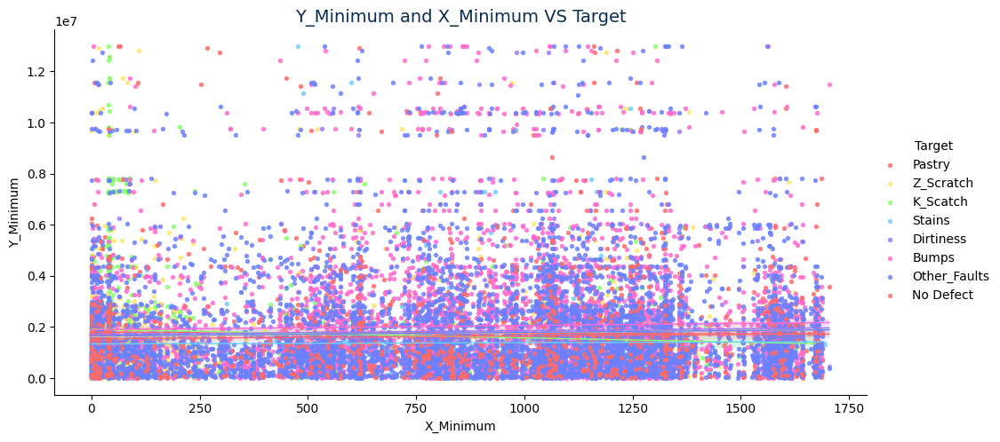

In [36]:
# Y_Minimum and X_Minimum VS Target
scatter_plot_by_hue(
    data=df_train,
    x="X_Minimum",
    y="Y_Minimum",
    hue="Target",
    title="Y_Minimum and X_Minimum VS Target"
)

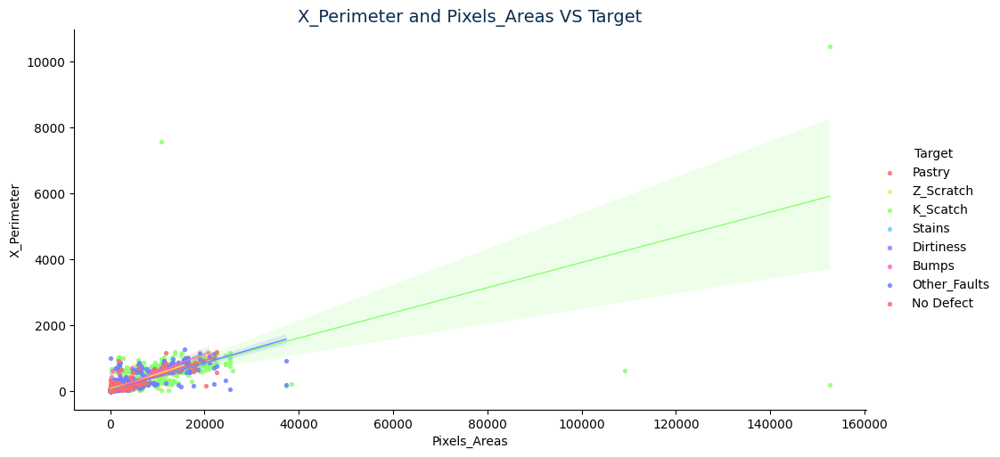

In [37]:
# Pixels_Areas vs X_Perimeter: Explore the relationship between the area of pixels and the perimeter along the x-axis.
scatter_plot_by_hue(
    data=df_train,
    x="Pixels_Areas",
    y="X_Perimeter",
    hue="Target",
    title="X_Perimeter and Pixels_Areas VS Target"
)

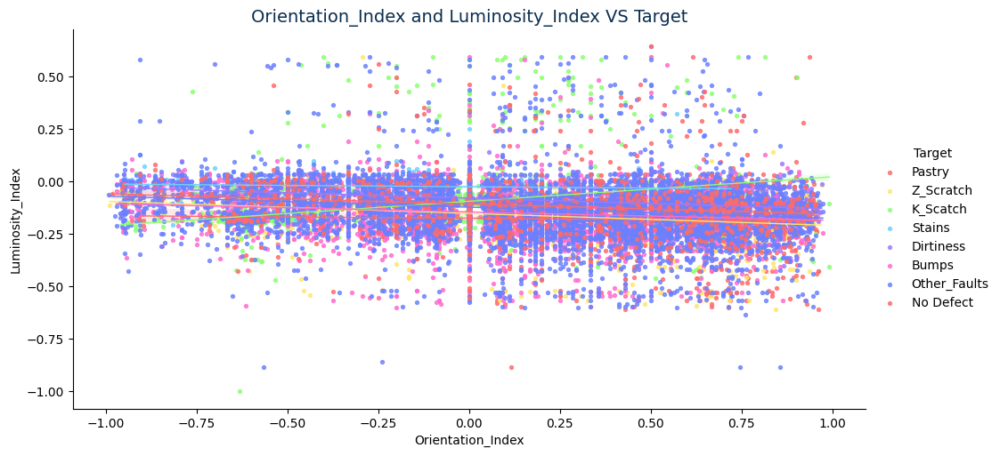

In [38]:
# Orientation_Index vs Luminosity_Index: Understand how the orientation index and luminosity index are related.
scatter_plot_by_hue(
    data=df_train,
    x="Orientation_Index",
    y="Luminosity_Index",
    hue="Target",
    title="Orientation_Index and Luminosity_Index VS Target"
)

# Numerical Feature Distribution

In [39]:
# Function to Plot Numerical Distribution With Respect to Target
def plot_numerical_distribution_with_hue(data, num_cols, hue_col='Target', figsize=(30, 30), dpi=300):
    # Create subplots
    fig, ax = plt.subplots(6, 4, figsize=figsize, dpi=dpi)
    ax = ax.flatten()

    # Loop through each column and plot the distribution with hue
    for i, column in enumerate(num_cols):
        sns.histplot(data=data, x=column, hue=hue_col, ax=ax[i], kde=True, palette='Set2')
        ax[i].set_title(f'{column} Distribution', size=14)
        ax[i].set_xlabel(None)
        ax[i].set_ylabel(None)

    # Set Tight Layout
    plt.tight_layout()

    # Show the plot
    plt.show()

In [40]:
# Calling Function
plot_numerical_distribution_with_hue(df_train, num_cols)

# Observations

1. Some Columns Are Nearly Gaussain Distributed.
2. Many are left Skewed and Right Skewewd.
3. Most are Very Very Skewed in Right or Left.
4. We Will Try to Handle That Using Normalization Methods Like Quantile Transformer

# Normalization

Quantile Transformer is a preprocessing technique used to transform features to follow a uniform or Gaussian distribution. It ensures that each feature has the same range of values, making them more comparable and suitable for models sensitive to feature scaling, such as linear regression and neural networks

In [41]:
# Normalizations Using Quantile Transformer

# Intlizer QuantileTransformer
qt = QuantileTransformer(output_distribution='normal')

# Fit and Transform
for col in num_cols:
    df_train[col] = qt.fit_transform(df_train[[col]])
for col in num_cols:
    df_test[col] = qt.fit_transform(df_test[[col]])

In [42]:
# Calling Function
plot_numerical_distribution_with_hue(df_train, num_cols)

#### now majority is gaussian 

# Feature Engineering

In [43]:
def add_advanced_features(df):
    # 4. Steel Type Indicator
    df['Steel_Type_Indicator'] = df['TypeOfSteel_A300'].astype(int) + df['TypeOfSteel_A400'].astype(int)

    # 5. Edges Density
    df['Edges_Density'] = df['Edges_Index'] * (df['X_Perimeter'] + df['Y_Perimeter'])

    # 6. Geometric Symmetry
    df['Geometric_Symmetry'] = (df['Square_Index'] + df['Empty_Index']) / 2

    # 7. Logarithmic Area Index
#     df['Logarithmic_Area_Index'] = df['LogOfAreas'] / (df['Log_X_Index'] + df['Log_Y_Index'])

    # 8. Statistical Index Combination
    df['Statistical_Index_Combination'] = df['Orientation_Index'] * df['Luminosity_Index']

    # 10. Global Edge Index
    df['Global_Edge_Index'] = df['Outside_Global_Index'] * (df['Edges_X_Index'] + df['Edges_Y_Index'])

    # 12. Contrast of Luminosity
    df['Contrast_of_Luminosity'] = abs(df['Maximum_of_Luminosity'] - df['Minimum_of_Luminosity']) / (df['Maximum_of_Luminosity'] + df['Minimum_of_Luminosity'])

    # 17. Area-Perimeter Ratio
#     df['Area_Perimeter_Ratio'] = df['Pixels_Areas'] / (df['X_Perimeter'] + df['Y_Perimeter'])

    # 18. Luminosity Deviation
    df['Luminosity_Deviation'] = df.groupby(['TypeOfSteel_A300', 'TypeOfSteel_A400'])['Sum_of_Luminosity'].transform('std')

    return df

# Calling Function
df_train = add_advanced_features(df_train)
df_test = add_advanced_features(df_test)

## Correlation Analysis

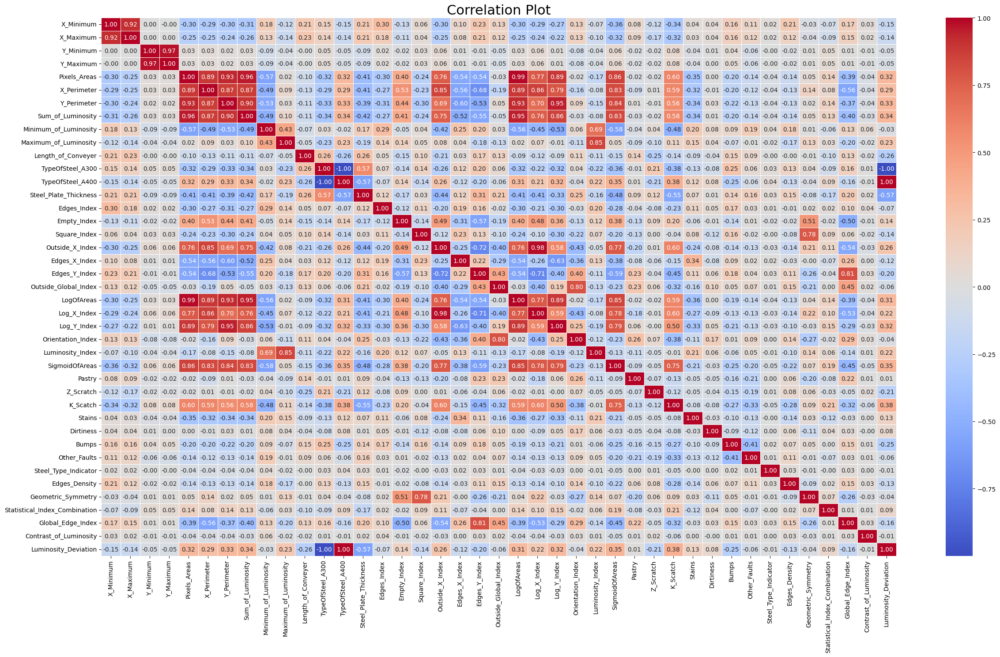

In [44]:
# Select only numeric columns
numeric_df_train = df_train.select_dtypes(include='number')

# Compute the correlation matrix
correlation_matrix = numeric_df_train.corr()

# Create a heatmap to visualize the correlation matrix
plt.figure(figsize=(25, 15))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Plot', fontsize=22)  
plt.tight_layout()  
plt.show()

In [45]:
# Define the correlation threshold
threshold = 0.5

# Extract upper triangular portion of the correlation matrix
upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))

# Find highly correlated features
highly_correlated = (upper_tri.abs() > threshold).any()

# Get the names of highly correlated features
correlated_features = upper_tri.columns[highly_correlated].tolist()

# Print the names of highly correlated features
print("Highly Correlated Features:")
print(correlated_features)

Highly Correlated Features:
['X_Maximum', 'Y_Maximum', 'X_Perimeter', 'Y_Perimeter', 'Sum_of_Luminosity', 'Minimum_of_Luminosity', 'TypeOfSteel_A400', 'Steel_Plate_Thickness', 'Empty_Index', 'Outside_X_Index', 'Edges_X_Index', 'Edges_Y_Index', 'LogOfAreas', 'Log_X_Index', 'Log_Y_Index', 'Orientation_Index', 'Luminosity_Index', 'SigmoidOfAreas', 'K_Scatch', 'Geometric_Symmetry', 'Global_Edge_Index', 'Luminosity_Deviation']


# Model building 

Train Test Split

In [55]:
# Dropping Null Values to | Skips any Error In Next Steps
df_train.dropna(inplace=True)
# X And y 
X = df_train.drop(['Pastry','Z_Scratch','K_Scatch','Stains','Dirtiness','Bumps','Other_Faults','Target'], axis=1)
y = df_train[target_col]

# Train Test Split 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Print Shape of X_train , X_test , y_train , y_test
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")
 #Dropping Some Columns From df_train
df_train.drop(['Pastry', 'Z_Scratch', 'K_Scatch', 'Stains', 'Dirtiness', 'Bumps', 'Other_Faults'], axis=1, inplace=True)
# Shape of Train and Test 
print(f"The shape of Train data is {df_train.shape}")
print(f"The shape of Test data is {df_test.shape}")

# Intilize Target 
TARGET = 'Target'

X_train shape: (19043, 34)
X_test shape: (2116, 34)
y_train shape: (19043, 7)
y_test shape: (2116, 7)
The shape of Train data is (21159, 35)
The shape of Test data is (12814, 35)


# MODELS TRAINED - initial  ( xgboost , catboost , random forest )

In [70]:
!pip install xgboost catboost scikit-learn



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 14.0 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.1/47.1 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 58.7 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.0
    Uninstalling numpy-2.2.0:
      Successfully uninstalled numpy-2.2.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pandas-ml 0.6.1 requires enum34, which is not installed.
mkl-fft 1.3.8 requires mkl, which is not installed.
tensorflow 2.17.0 requires ml-dtypes<0.5.0,>=0.3.1, but you have ml-dtypes 0.5.0 which is incompatible.
responsibleai 0.36.0 requires networkx<=2.5, but you have networkx 3.3 which is incompatible.
responsibleai 0.36.0 requires numpy<=1.26.2,>=1.17.2, but you have numpy 1.26.4 which is incompatible.
raiwi

In [75]:
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier

import pandas as pd
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import roc_auc_score, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
import matplotlib.pyplot as plt
import numpy as np

# Assuming df_train is your training DataFrame and df_test is your test DataFrame

# Define feature columns (excluding 'Target' and any other non-feature columns)
features = [col for col in df_train.columns if col not in ['Target', 'Encoded_Target']]
X = df_train[features]
y = df_train['Encoded_Target']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)



In [76]:
# Initialize models
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
xgb_model = XGBClassifier(objective='multi:softprob', num_class=len(np.unique(y)), eval_metric='mlogloss', use_label_encoder=False, seed=42)
cat_model = CatBoostClassifier(loss_function='MultiClass', iterations=100, learning_rate=0.1, depth=10, verbose=False, random_seed=42)

# Train and evaluate function
def train_and_evaluate(model, model_name):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)
    auc = roc_auc_score(y_test, y_pred_proba, multi_class='ovr')
    accuracy = accuracy_score(y_test, y_pred)
    print(f'{model_name} AUC: {auc:.4f}')
    print(f'{model_name} Accuracy: {accuracy:.4f}')
    return y_pred_proba

# Train and evaluate all models
rf_probs = train_and_evaluate(rf_model, "Random Forest")
xgb_probs = train_and_evaluate(xgb_model, "XGBoost")
cat_probs = train_and_evaluate(cat_model, "CatBoost")



Random Forest AUC: 0.8460
Random Forest Accuracy: 0.5898
XGBoost AUC: 0.8593
XGBoost Accuracy: 0.5931
CatBoost AUC: 0.8605
CatBoost Accuracy: 0.5851


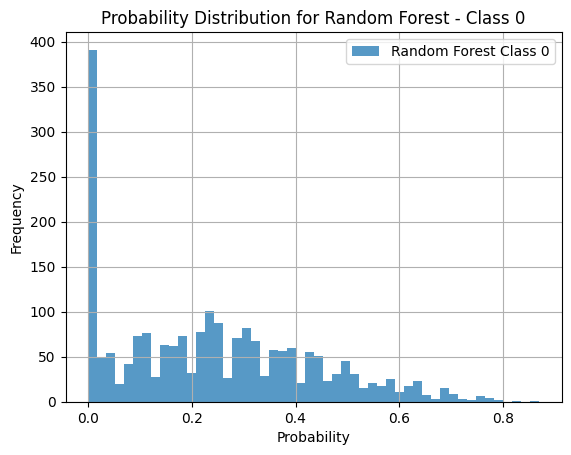

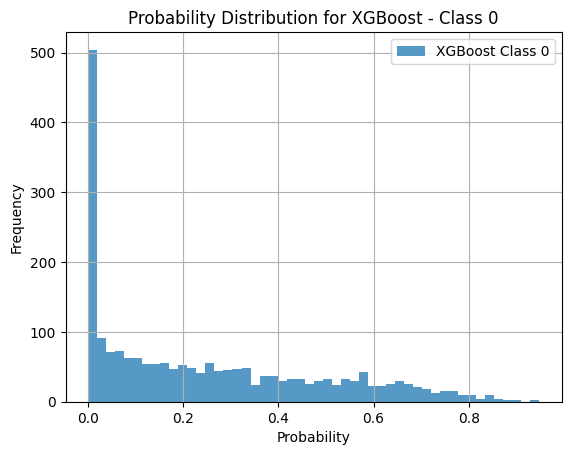

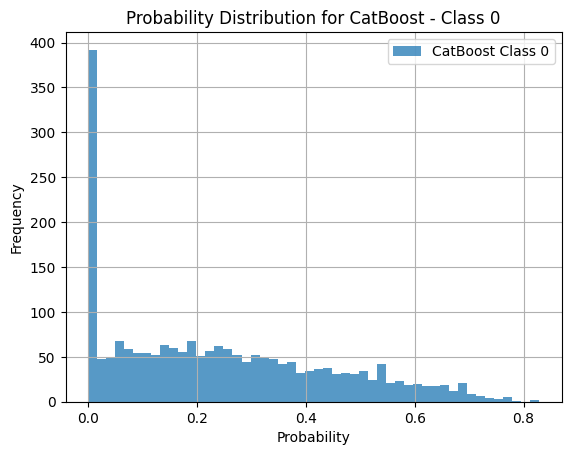

In [77]:
def plot_probability_distribution(probs, model_name):
    plt.hist(probs[:, 0], bins=50, alpha=0.75, label=f'{model_name} Class 0')
    plt.xlabel('Probability')
    plt.ylabel('Frequency')
    plt.title(f'Probability Distribution for {model_name} - Class 0')
    plt.grid(True)
    plt.legend()
    plt.show()

plot_probability_distribution(rf_probs, "Random Forest")
plot_probability_distribution(xgb_probs, "XGBoost")
plot_probability_distribution(cat_probs, "CatBoost")


In [78]:
# Train CatBoost on the entire dataset
final_model = CatBoostClassifier(loss_function='MultiClass', iterations=100, learning_rate=0.1, depth=10, verbose=False, random_seed=42)
final_model.fit(X, y)  # Assuming X and y cover the entire dataset without the test split

# Assuming df_test is prepared and has the same feature processing as df_train
X_final_test = df_test[features]  # features must be defined as earlier and processed the same way

# Predict probabilities
final_predictions = final_model.predict_proba(X_final_test)


In [79]:
# Create a DataFrame for submission
submission_df = pd.DataFrame(final_predictions, columns=[f"Class_{i}" for i in range(final_predictions.shape[1])])

# If 'id' is needed and exists in df_test
submission_df['id'] = df_test['id']

# Ensure columns are in the expected order
submission_df = submission_df[['id'] + [f"Class_{i}" for i in range(final_predictions.shape[1])]]

# Save the submission file
submission_df.to_csv('final_submission.csv', index=False)


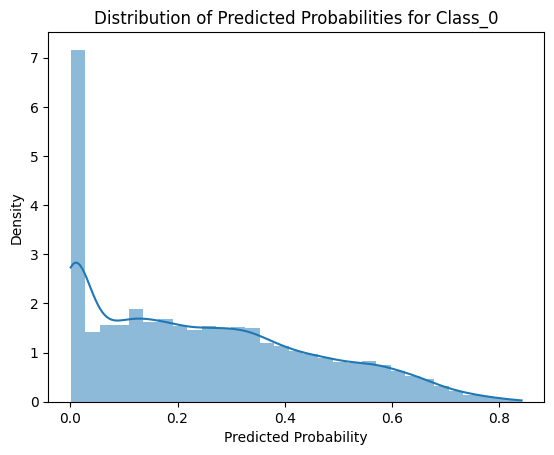

In [80]:
import seaborn as sns

# Let's visualize the probability distribution for the first class in the final predictions
sns.histplot(final_predictions[:, 0], kde=True, stat="density", linewidth=0)
plt.title('Distribution of Predicted Probabilities for Class_0')
plt.xlabel('Predicted Probability')
plt.ylabel('Density')
plt.show()


In [81]:
# Assuming final_predictions contains the prediction probabilities from your best model
# Create a DataFrame for the probabilities using the class names as decoded by the encoder
class_names = encoder.inverse_transform(range(len(df_train['Encoded_Target'].unique())))
submission_df = pd.DataFrame(final_predictions, columns=class_names)

# Assuming df_test contains an 'id' column that should be included in the submission
submission_df['id'] = df_test['id']

# Reorder the DataFrame to have 'id' as the first column
submission_df = submission_df[['id'] + list(class_names)]

# Save the submission file
submission_df.to_csv('final_submission1.csv', index=False)


# using SVM (KERNEL TRICK thanks)

In [82]:
import pandas as pd
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import roc_auc_score
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

# Assuming df_train and df_test are already loaded and preprocessed appropriately

# Define feature columns and prepare features and target variables
features = [col for col in df_train.columns if col not in ['Target', 'Encoded_Target']]
X = df_train[features]
y = df_train['Encoded_Target']

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)


In [83]:
# Create an SVM model with RBF kernel
svm_model = make_pipeline(StandardScaler(), SVC(kernel='rbf', probability=True, random_state=42))

# Train the model
svm_model.fit(X_train, y_train)


Pipeline(steps=[('standardscaler', StandardScaler()),
                ('svc', SVC(probability=True, random_state=42))])

In [84]:
# Predict probabilities on the test set
y_pred_proba = svm_model.predict_proba(X_test)
auc_score = roc_auc_score(y_test, y_pred_proba, multi_class='ovr')
print(f'SVM AUC: {auc_score:.4f}')


SVM AUC: 0.8393


In [86]:
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline

# Create an imputer object that fills 'NaN' with the median value of each column
imputer = SimpleImputer(strategy='median')

# Update the pipeline to include imputation
full_model = Pipeline([
    ('imputer', imputer),
    ('scaler', StandardScaler()),
    ('svm', SVC(kernel='rbf', probability=True, random_state=42))
])

# Train the model on the full dataset
full_model.fit(X, y)

# Predict probabilities on the final test set
X_final_test = df_test[features]  # Ensure this is prepared similarly to the training data
final_predictions = full_model.predict_proba(X_final_test)

# Assuming the original classes are properly labeled as per competition's requirement
# and you have a LabelEncoder object called 'encoder' to revert the label encoding
class_names = encoder.inverse_transform(range(len(np.unique(y))))

# Create submission DataFrame
submission_df = pd.DataFrame(final_predictions, columns=class_names)
submission_df['id'] = df_test['id']
submission_df = submission_df[['id'] + list(class_names)]

# Save the submission file
submission_df.to_csv('final_submission_svm.csv', index=False)


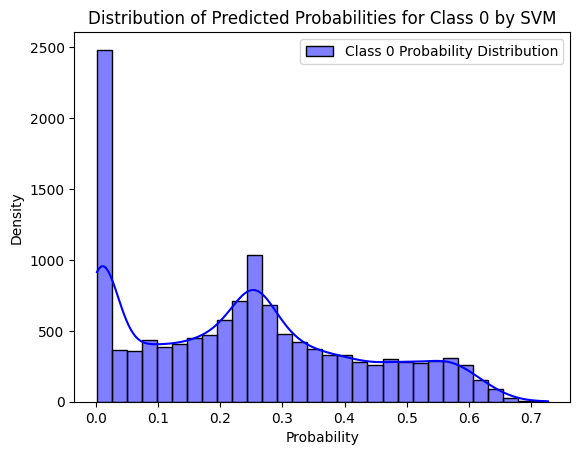

In [87]:
import seaborn as sns
import matplotlib.pyplot as plt

# Visualization of probability distribution for a specific class
sns.histplot(final_predictions[:, 0], kde=True, color='blue', label='Class 0 Probability Distribution')
plt.xlabel('Probability')
plt.ylabel('Density')
plt.title('Distribution of Predicted Probabilities for Class 0 by SVM')
plt.legend()
plt.show()


In [90]:
# Load the CSV file to examine its structure
import pandas as pd

# Load the CSV file
file_path = 'submission.csv'
data = pd.read_csv(file_path)

# Display the first few rows of the DataFrame
data.head()


,id,0,1,2,3,4,5,6,7
0,19219,0.128816,0.011377,0.002381,0.023300,0.260275,0.571741,0.000533,0.001577
1,19220,0.133301,0.221684,0.010769,0.021420,0.351337,0.244098,0.000939,0.016451
2,19221,0.319726,0.011442,0.034958,0.089132,0.509559,0.003524,0.001849,0.029810
3,19222,0.405960,0.009985,0.001633,0.028166,0.390861,0.158575,0.001492,0.003328
4,19223,0.620587,0.004565,0.001620,0.046223,0.319608,0.003532,0.001121,0.002746


In [91]:
# Suppose we have the original class names in the correct order:
original_class_names = ['Pastry', 'Z_Scratch', 'K_Scatch', 'Stains', 'Dirtiness', 'Bumps', 'Other_Faults', 'Class_7']  # Adjust this list according to actual names

# Rename the columns
data.columns = ['id'] + original_class_names

# Save the corrected DataFrame to a new CSV file
corrected_file_path = 'corrected_submission.csv'
data.to_csv(corrected_file_path, index=False)


# Future work

### advanced methodology 

In [92]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

# Define base models
base_models = [
    ('rf', RandomForestClassifier(n_estimators=100, random_state=42)),
    ('svc', make_pipeline(StandardScaler(), SVC(probability=True, random_state=42))),
    ('dt', DecisionTreeClassifier(random_state=42))
]

# Initialize Stacking Classifier with a logistic regression meta-classifier
stack_model = StackingClassifier(
    estimators=base_models, 
    final_estimator=LogisticRegression(),
    stack_method='predict_proba',
    passthrough=True
)

# Training the stacking model
stack_model.fit(X_train, y_train)

# Predict probabilities on the test set
y_pred_proba_stack = stack_model.predict_proba(X_test)
auc_score_stack = roc_auc_score(y_test, y_pred_proba_stack, multi_class='ovr')
print(f'Stacked Model AUC: {auc_score_stack:.4f}')


Stacked Model AUC: 0.8481


In [96]:
#fitting model
stack_model.fit(X, y)


StackingClassifier(estimators=[('rf', RandomForestClassifier(random_state=42)),
                               ('svc',
                                Pipeline(steps=[('standardscaler',
                                                 StandardScaler()),
                                                ('svc',
                                                 SVC(probability=True,
                                                     random_state=42))])),
                               ('dt', DecisionTreeClassifier(random_state=42))],
                   final_estimator=LogisticRegression(), passthrough=True,
                   stack_method='predict_proba')

In [98]:
from sklearn.impute import SimpleImputer

# Create an imputer object with a median filling strategy
imputer = SimpleImputer(strategy='median')

# Fit on the training data and transform both train and test data
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)  # Assuming X_test is your df_test[features]

# Now df_test should be free of NaN values


In [99]:
# Retrain the stacking model on the imputed training data
stack_model.fit(X_train_imputed, y_train)

# Predict probabilities on the imputed test data
final_predictions = stack_model.predict_proba(X_test_imputed)

# 
class_names = ['Class_0', 'Class_1', 'Class_2', 'Class_3', 'Class_4', 'Class_5', 'Class_6', 'Class_7']  # Customize this list based on actual names

# Create a DataFrame for submission
submission_df = pd.DataFrame(final_predictions, columns=class_names)
submission_df.insert(0, 'id', df_test['id'])  # Assuming 'id' is the identifier column in your test set

# Save to CSV for submission
submission_df.to_csv('final_submission.csv', index=False)


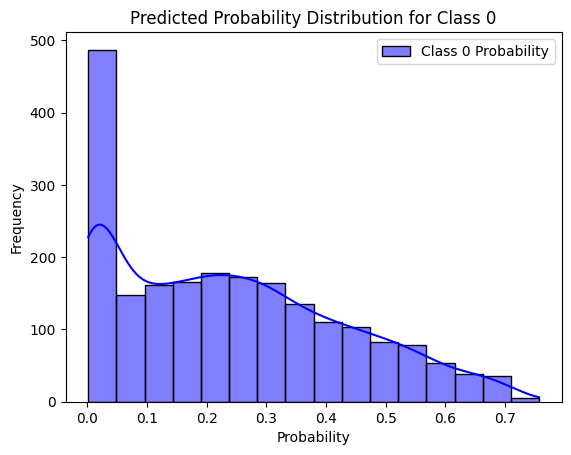

In [100]:
import seaborn as sns
import matplotlib.pyplot as plt

# Example: Visualize the probability distribution for 'Class_0'
sns.histplot(final_predictions[:, 0], kde=True, color='blue', label='Class 0 Probability')
plt.xlabel('Probability')
plt.ylabel('Frequency')
plt.title('Predicted Probability Distribution for Class 0')
plt.legend()
plt.show()
